<a href="https://colab.research.google.com/github/sathasivamn/Project-586--Customer-Segmentation/blob/main/Project_586_Customer_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Title - Customer Personality Analysis
# Week - 3 - Complete EDA, Modeling, Evaluation & Streamlit Deployment

In [1]:
# Importing necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

# Automated EDA (ydata-profiling)

In [1]:
!pip install ydata_profiling --upgrade

from ydata_profiling import ProfileReport

import pandas as pd
from ydata_profiling import ProfileReport

# Load dataset
df = pd.read_excel("marketing_campaign.xlsx")

profile = ProfileReport (df, title = "Customer Personality EDA Report", explorative = True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 29/29 [00:00<00:00, 46.95it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# EDA — Data Exploration

In [5]:
# Manual EDA — Data Exploration
# Basic info

print("Shape:", df.shape)
display(df.head(5))
df.info()
df.describe().T

# Missing values
missing = df.isnull().sum().sort_values(ascending=False)
missing_percent = (missing / len(df) * 100).round(2)
pd.concat([missing, missing_percent], axis=1).rename(columns={0:'missing_count',1:'missing_pct'})

# Duplicates
print("Duplicates:", df.duplicated().sum())

Shape: (2240, 29)


,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,...,5,0,0,0,0,0,0,3,11,0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   ID                   2240 non-null   int64         
 1   Year_Birth           2240 non-null   int64         
 2   Education            2240 non-null   object        
 3   Marital_Status       2240 non-null   object        
 4   Income               2216 non-null   float64       
 5   Kidhome              2240 non-null   int64         
 6   Teenhome             2240 non-null   int64         
 7   Dt_Customer          2240 non-null   datetime64[ns]
 8   Recency              2240 non-null   int64         
 9   MntWines             2240 non-null   int64         
 10  MntFruits            2240 non-null   int64         
 11  MntMeatProducts      2240 non-null   int64         
 12  MntFishProducts      2240 non-null   int64         
 13  MntSweetProducts     2240 non-nul

# Data Cleaning & Feature Creation

In [7]:
# Handle missing income values
df = df.dropna(subset=['Income'])

# Remove duplicates
df = df.drop_duplicates()

# Feature Engineering

In [8]:
# Feature engineering

# Convert date field
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'])
df['Age'] = 2025 - df['Year_Birth']

# Create new feature: Customer tenure
df['Customer_For'] = (df['Dt_Customer'].max() - df['Dt_Customer']).dt.days
df['TotalKids'] = df['Kidhome'] + df['Teenhome']

# Total spending
spend_cols = ['MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds']
df['TotalSpend'] = df[spend_cols].sum(axis=1)

# Example derived metrics
df['AvgSpendPerPurchase'] = df['TotalSpend'] / (1 + df[['NumWebPurchases','NumCatalogPurchases','NumStorePurchases']].sum(axis=1))

# Drop unnecessary columns
df = df.drop(columns=['Z_CostContact', 'Z_Revenue'], errors='ignore')

# Reset index after cleaning
df.reset_index(drop=True, inplace=True)

# Data Visualization

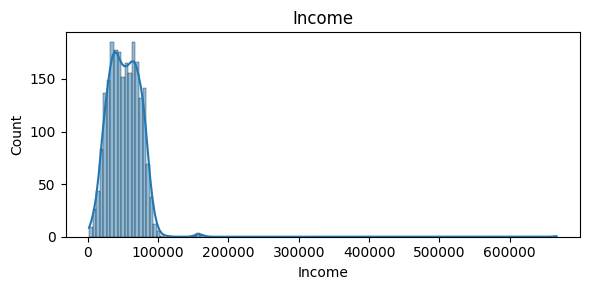

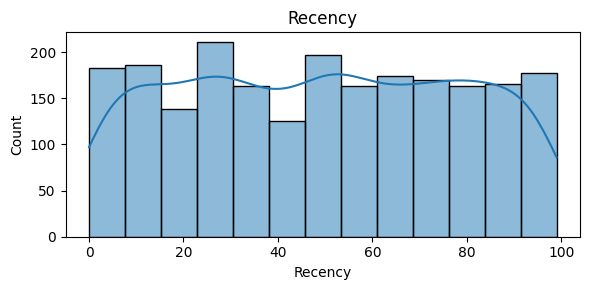

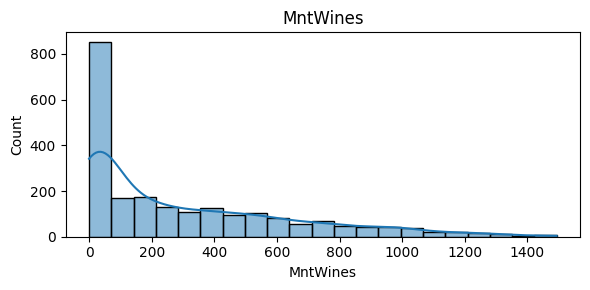

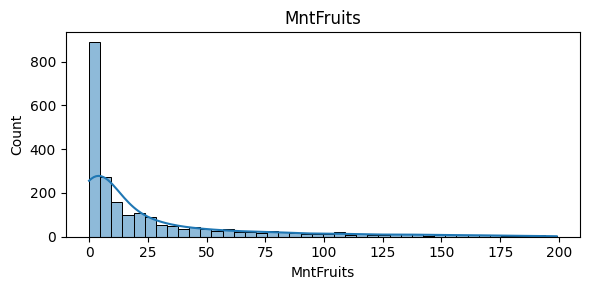

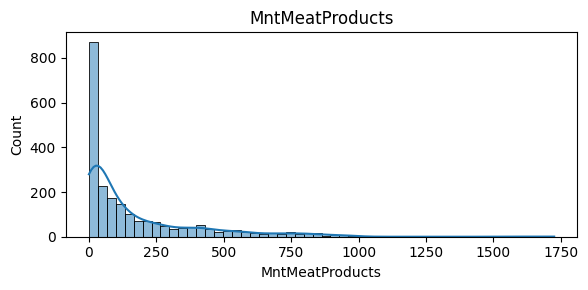

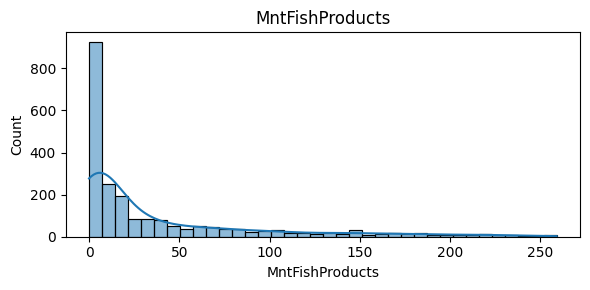

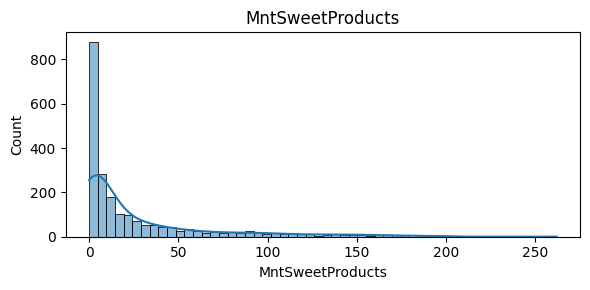

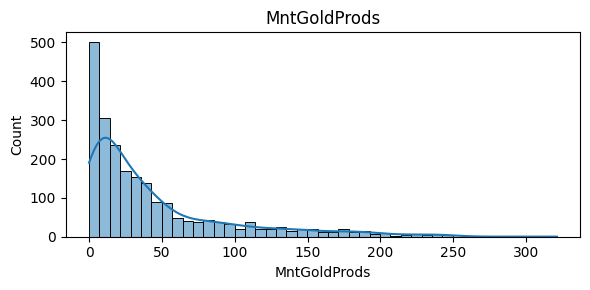

In [14]:
# 1. Distribution plots for numeric variables
import matplotlib.pyplot as plt # Import matplotlib.pyplot here
import seaborn as sns # Import seaborn here
import os

# Create the 'plots' directory if it doesn't exist
if not os.path.exists('plots'):
    os.makedirs('plots')


num_cols = ['Income','Recency','MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds']
for c in num_cols:
    plt.figure(figsize=(6,3))
    sns.histplot(df[c].dropna(), kde=True)
    plt.title(c)
    plt.tight_layout()
    plt.show()

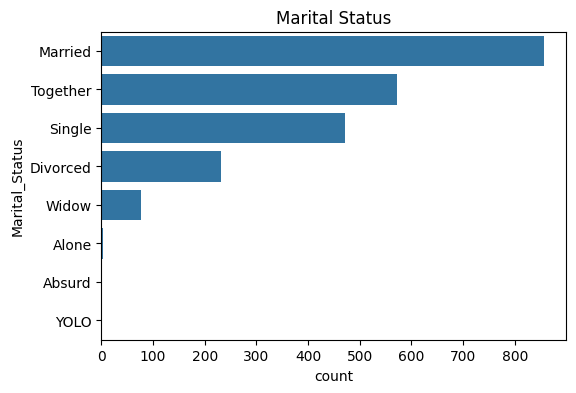

In [16]:
# 2. Categorical counts
plt.figure(figsize=(6,4))
sns.countplot(y='Marital_Status', data=df, order=df['Marital_Status'].value_counts().index)
plt.title('Marital Status')
plt.show()

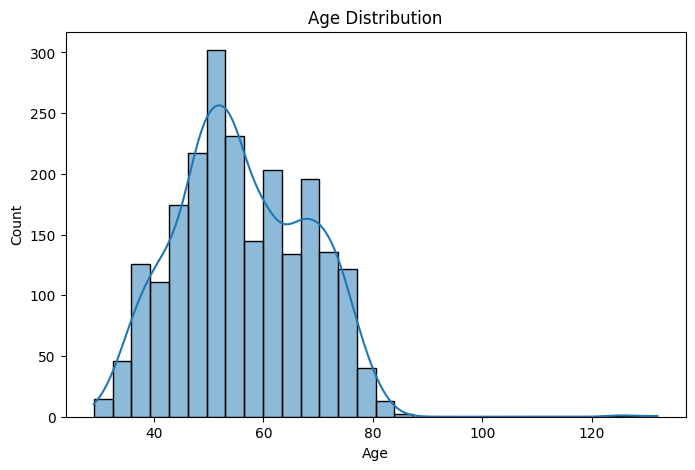

Observation: Most customers are between 35–60 years old


In [17]:
# Univariate & Bivariate Analysis
# Age Distribution
plt.figure(figsize=(8,5))
sns.histplot(df['Age'], bins=30, kde=True)
plt.title('Age Distribution')
plt.show()

print ("Observation: Most customers are between 35–60 years old")

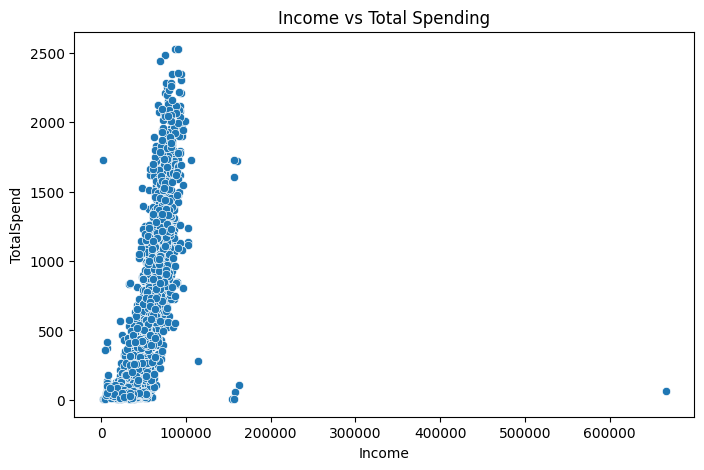

Observation: Positive relationship — higher income leads to higher total spend.


In [18]:
# Income vs Total Spending
plt.figure(figsize=(8,5))
sns.scatterplot(x='Income', y='TotalSpend', data=df)
plt.title('Income vs Total Spending')
plt.show()

print ("Observation: Positive relationship — higher income leads to higher total spend.")

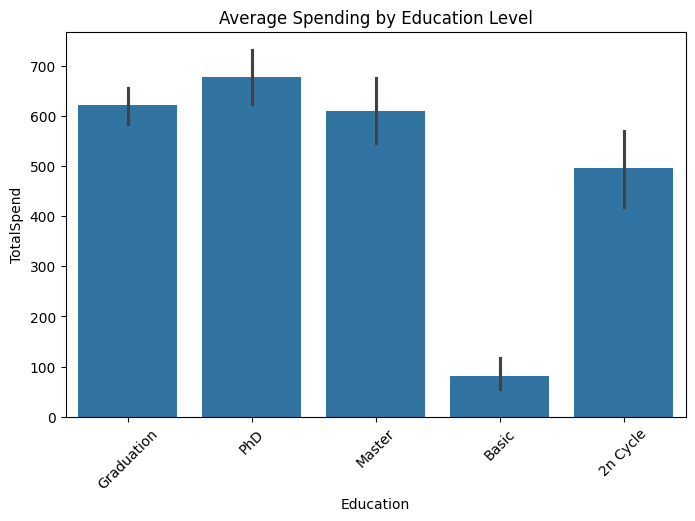

Observation: Graduate and PhD customers spend the most.


In [20]:
# Average Spending by Education
import numpy as np
plt.figure(figsize=(8,5))
sns.barplot(x='Education', y='TotalSpend', data=df, estimator=np.mean)
plt.xticks(rotation=45)
plt.title('Average Spending by Education Level')
plt.show()

print ("Observation: Graduate and PhD customers spend the most.")

# Correlation Analysis

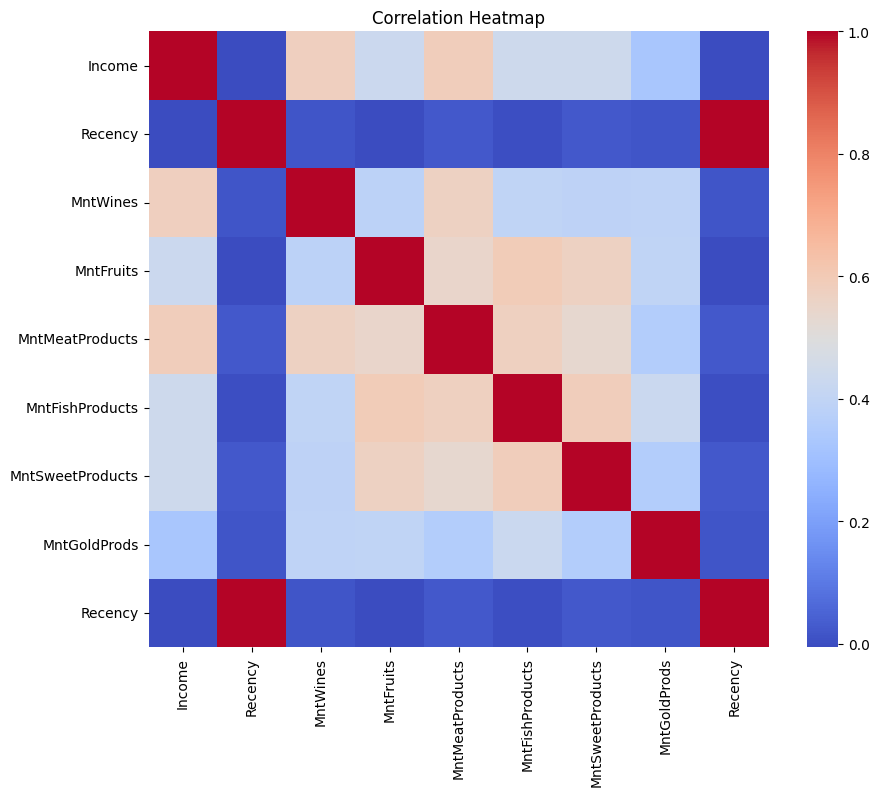

In [24]:
# Correlation heatmap (numeric)
plt.figure(figsize=(10,8))
sns.heatmap(df[num_cols + ['Recency']].corr(), annot=False, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

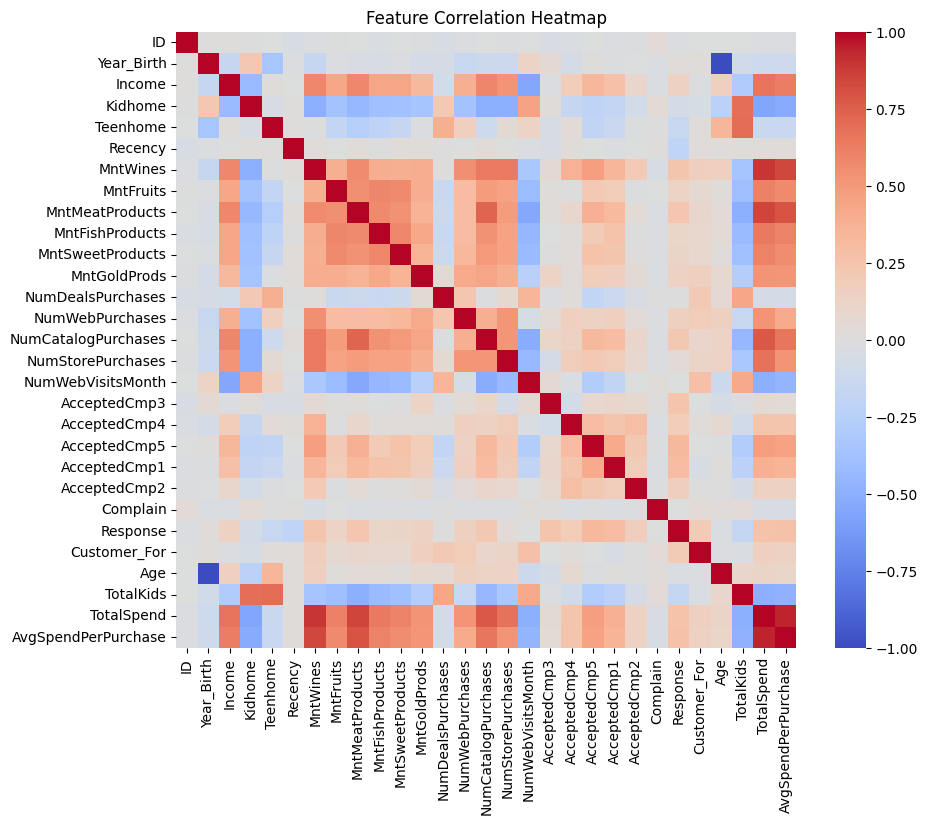

Observation 1:Income, Age, and TotalSpend are key influencing factors.
Observation 2: Some product categories are correlated — e.g., Meat and Wine.


In [23]:
# Correlationa Analysis
plt.figure(figsize=(10,8))
corr = df.corr(numeric_only=True)
sns.heatmap(corr, cmap='coolwarm', annot=False)
plt.title('Feature Correlation Heatmap')
plt.show()

print ("Observation 1:Income, Age, and TotalSpend are key influencing factors.")
print ("Observation 2: Some product categories are correlated — e.g., Meat and Wine.")

# Preprocessing Pipeline (scaling, encoding)

In [27]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
import joblib

# Features for clustering
features = ['Income','Recency','TotalSpend','Age','Customer_For','TotalKids','NumWebVisitsMonth']

# Adding encoded categorical (e.g., Education, Marital_Status)
cat_cols = ['Education','Marital_Status']
num_cols = features.copy()

preprocessor = ColumnTransformer(transformers=[
    ('num', StandardScaler(), num_cols),
    ('cat', OneHotEncoder(drop='first'), cat_cols)
], remainder='drop')

X_pre = preprocessor.fit_transform(df[num_cols + cat_cols])

# Save transformer
joblib.dump(preprocessor, 'preprocessor.joblib')

['preprocessor.joblib']

# Dimensionality reduction for visualization & noise removal

In [28]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_pre)
print("PCA explained variance ratio:", pca.explained_variance_ratio_.sum())
joblib.dump(pca, 'pca_transform.joblib')

PCA explained variance ratio: 0.44234108692582996


['pca_transform.joblib']

# Model Tuning & Feature Engineering
## Build and Tune 4 Clustering Models

### 1. K-Means (Elbow + silhouette)
### 2. Hierarchical (Agglomerative Clustering) - tune k and linkage
### 3. DBSCAN - tune eps and min_samples
### 4. Gaussian Mixture Model (GMM) - tune n_components and covariance_type

# We evaluate with:

## Silhouette Score (primary)
## Calinski-Harabasz (secondary, higher better)
## Davies-Bouldin (secondary, lower better)


# Utility functions for evaluation & grid search

In [29]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.mixture import GaussianMixture
import itertools, tqdm

def evaluate_labels(X, labels):
    if len(set(labels)) <= 1:  # invalid clustering
        return {'sil': -1, 'ch': -1, 'db': np.inf, 'n_clusters': len(set(labels))}
    return {
        'sil': silhouette_score(X, labels),
        'ch': calinski_harabasz_score(X, labels),
        'db': davies_bouldin_score(X, labels),
        'n_clusters': len(set(labels))
    }

# Model 1 - K-Means tuning

In [30]:
k_range = range(2,11)
kmeans_results = []
for k in k_range:
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = km.fit_predict(X_pre)
    scores = evaluate_labels(X_pre, labels)
    scores.update({'model':'KMeans','param_k':k})
    kmeans_results.append(scores)
kmeans_df = pd.DataFrame(kmeans_results).sort_values(by='sil',ascending=False)
print(kmeans_df.head())

        sil          ch        db  n_clusters   model  param_k
0  0.212780  624.347322  1.763945           2  KMeans        2
1  0.142936  451.503071  2.126963           3  KMeans        3
2  0.132779  377.179361  2.028751           4  KMeans        4
3  0.126869  329.347175  2.000025           5  KMeans        5
6  0.126807  270.244314  1.695843           8  KMeans        8


# Model 2 - Agglomerative tuning

In [31]:
linkages = ['ward','complete','average']  # note: ward requires Euclidean
agg_results = []
for k in range(2,11):
    for link in linkages:
        try:
            ag = AgglomerativeClustering(n_clusters=k, linkage=link)
            labels = ag.fit_predict(X_pre)
            scores = evaluate_labels(X_pre, labels)
            scores.update({'model':'Agglomerative','param_k':k,'linkage':link})
            agg_results.append(scores)
        except Exception as e:
            pass
agg_df = pd.DataFrame(agg_results).sort_values(by='sil',ascending=False)
print(agg_df.head())

        sil         ch        db  n_clusters          model  param_k   linkage
1  0.842069  74.542179  0.112713           2  Agglomerative        2  complete
2  0.842069  74.542179  0.112713           2  Agglomerative        2   average
5  0.448799  44.560742  0.600220           3  Agglomerative        3   average
4  0.394704  54.414869  0.694863           3  Agglomerative        3  complete
8  0.364017  41.271617  0.731327           4  Agglomerative        4   average


# Model 3 - DBSCAN tuning (density-based)

In [32]:
eps_values = [0.3,0.4,0.5,0.6,0.8,1.0,1.2]  # scaled feature space — experiment
min_samples_values = [3,5,7,10]

db_results = []
for eps, ms in itertools.product(eps_values, min_samples_values):
    db = DBSCAN(eps=eps, min_samples=ms)
    labels = db.fit_predict(X_pre)
    if len(set(labels)) <= 1:
        continue
    scores = evaluate_labels(X_pre, labels)
    scores.update({'model':'DBSCAN','eps':eps,'min_samples':ms})
    db_results.append(scores)
db_df = pd.DataFrame(db_results).sort_values(by='sil', ascending=False)
print(db_df.head())

         sil         ch        db  n_clusters   model  eps  min_samples
4  -0.151441   2.469411  1.507352           2  DBSCAN  0.6            5
11 -0.170836  10.130715  1.667460           4  DBSCAN  1.0           10
7  -0.206810   4.980633  1.471398           6  DBSCAN  0.8            7
12 -0.214597   7.780879  1.514746         119  DBSCAN  1.2            3
10 -0.242223  13.779434  1.706900           7  DBSCAN  1.0            7


# Model 4 - GMM tuning (soft clustering)

In [33]:
gmm_results = []
for k in range(2,11):
    for cov in ['full','tied','diag','spherical']:
        try:
            gmm = GaussianMixture(n_components=k, covariance_type=cov, random_state=42)
            labels = gmm.fit_predict(X_pre)
            scores = evaluate_labels(X_pre, labels)
            scores.update({'model':'GMM','param_k':k,'cov':cov})
            gmm_results.append(scores)
        except Exception as e:
            pass
gmm_df = pd.DataFrame(gmm_results).sort_values(by='sil', ascending=False)
print(gmm_df.head())

         sil          ch        db  n_clusters model  param_k        cov
3   0.217980  621.605309  1.749136           2   GMM        2  spherical
1   0.206368  564.571772  1.794492           2   GMM        2       tied
7   0.130961  432.322223  2.220526           3   GMM        3  spherical
11  0.130612  374.496569  2.034400           4   GMM        4  spherical
5   0.128424  394.469572  2.332527           3   GMM        3       tied


# Model Comparison & Select Best

In [34]:
# collect top result from each model type
candidates = pd.concat([
    kmeans_df.head(3),
    agg_df.head(3),
    db_df.head(3),
    gmm_df.head(3)
], ignore_index=True, sort=False)

# sort by silhouette primarily, then CH
candidates_sorted = candidates.sort_values(by=['sil','ch'], ascending=[False,False]).reset_index(drop=True)
print(candidates_sorted.head(10))

# Choose best by silhouette (tie-breaker: CH vs DB)
best_model_row = candidates_sorted.iloc[0]
best_model_row

        sil          ch        db  n_clusters          model  param_k  \
0  0.842069   74.542179  0.112713           2  Agglomerative      2.0   
1  0.842069   74.542179  0.112713           2  Agglomerative      2.0   
2  0.448799   44.560742  0.600220           3  Agglomerative      3.0   
3  0.217980  621.605309  1.749136           2            GMM      2.0   
4  0.212780  624.347322  1.763945           2         KMeans      2.0   
5  0.206368  564.571772  1.794492           2            GMM      2.0   
6  0.142936  451.503071  2.126963           3         KMeans      3.0   
7  0.132779  377.179361  2.028751           4         KMeans      4.0   
8  0.130961  432.322223  2.220526           3            GMM      3.0   
9 -0.151441    2.469411  1.507352           2         DBSCAN      NaN   

    linkage  eps  min_samples        cov  
0  complete  NaN          NaN        NaN  
1   average  NaN          NaN        NaN  
2   average  NaN          NaN        NaN  
3       NaN  NaN        

,0
sil,0.842069
ch,74.542179
db,0.112713
n_clusters,2
model,Agglomerative
param_k,2.0
linkage,complete
eps,NaN
min_samples,NaN
cov,NaN


# Fit & Save the Best Model

In [35]:
# Example: if best model is KMeans with k=4:
best_model_name = best_model_row['model']
if best_model_name == 'KMeans':
    best_k = int(best_model_row['param_k'])
    final_model = KMeans(n_clusters=best_k, random_state=42, n_init=20).fit(X_pre)
    joblib.dump(final_model, 'best_model.joblib')
elif best_model_name == 'GMM':
    best_k = int(best_model_row['param_k'])
    cov = best_model_row['cov']
    final_model = GaussianMixture(n_components=best_k, covariance_type=cov, random_state=42).fit(X_pre)
    joblib.dump(final_model, 'best_model.joblib')
elif best_model_name == 'Agglomerative':
    final_model = AgglomerativeClustering(n_clusters=int(best_model_row['param_k']), linkage=best_model_row['linkage'])
    final_model.fit(X_pre)  # note: AgglomerativeClustering doesn't have predict; store labels instead
    joblib.dump(final_model, 'best_model.joblib')
else: # DBSCAN
    final_model = DBSCAN(eps=best_model_row['eps'], min_samples=int(best_model_row['min_samples']))
    final_model.fit(X_pre)
    joblib.dump(final_model, 'best_model.joblib')

# Save the preprocessor & PCA for deployment
joblib.dump(preprocessor, 'preprocessor.joblib')
joblib.dump(pca, 'pca_transform.joblib')

['pca_transform.joblib']

# Cluster Profiling

In [38]:
# attach cluster labels
if hasattr(final_model, 'predict'):
    labels = final_model.predict(X_pre)
else:
    labels = final_model.labels_

df['cluster'] = labels

profile = df.groupby('cluster').agg({
    'Income':'mean','Age':'mean','TotalSpend':'mean','Recency':'mean','Customer_For':'mean','TotalKids':'mean',
    'ID':'count'
}).rename(columns={'ID':'count'}).round(2)
profile['pct'] = (profile['count'] / profile['count'].sum()*100).round(2)
display(profile)

,Income,Age,TotalSpend,Recency,Customer_For,TotalKids,count,pct
cluster,,,,,,,,
0,51969.86,56.18,607.32,49.02,353.5,0.95,2215,99.95
1,666666.00,48.00,62.00,23.00,392.0,1.00,1,0.05
